In [1]:
#import statements
import matplotlib.pyplot as plt
import numpy as np
import math

# Final Project - Digital Signal Processing (Spring 2024)


## DUE:  4 May 2024 

## NAME: Anastasia Horne $\hspace{2.5in}$  STUDENT NUMBER: 10867499 

## Topic 1: Understanding Convolution, Cross-Correlation and Auto-Correlation

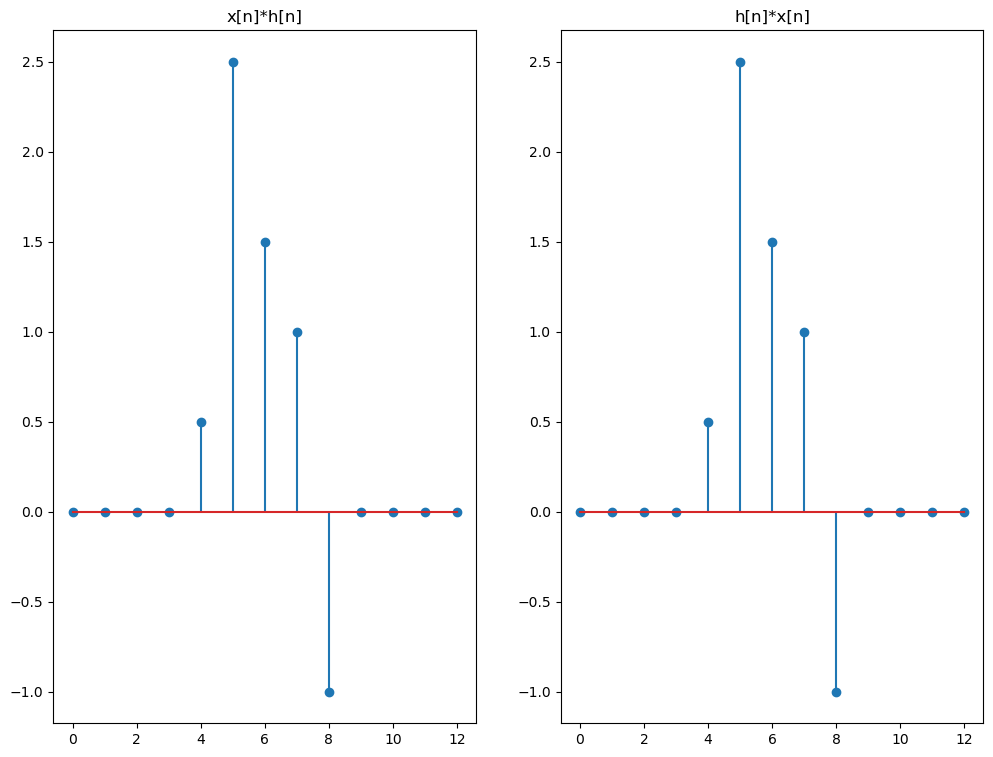

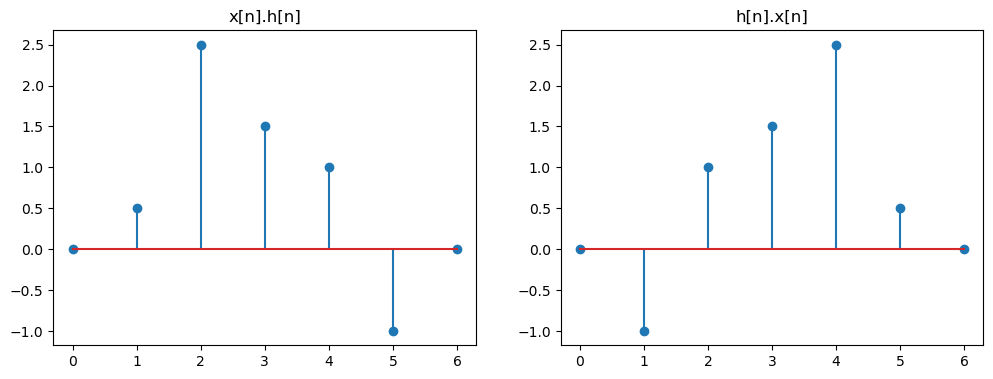

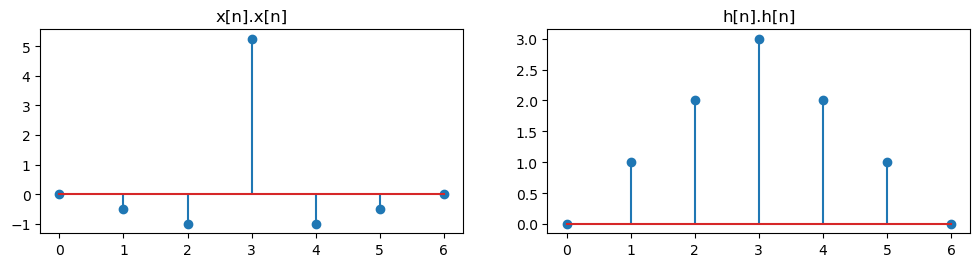

In [2]:
#create the signals x[n] and h[n]
h=[0, 0, 1, 1, 1, 0, 0]
x=[0, 0, 0.5, 2, -1, 0, 0]

#1 plot the convolution of x[n]*h[n] and h[n]*x[n]
xCh= np.convolve(x,h)
hCx= np.convolve(h,x)
plt.figure(figsize=(12, 9))

plt.subplot(1, 2, 1)
plt.stem(xCh)
plt.title("x[n]*h[n]")

plt.subplot(1, 2, 2)
plt.stem(hCx)
plt.title("h[n]*x[n]")
plt.show()

#2 plot the cross-correlation results of x[n].h[n] and h[n].x[n]
xCCh=np.correlate(x,h, mode="same")
hCCx=np.correlate(h,x, mode="same")
plt.figure(figsize=(12, 9))

plt.subplot(2, 2, 1)
plt.stem(xCCh)
plt.title("x[n].h[n]")

plt.subplot(2, 2, 2)
plt.stem(hCCx)
plt.title("h[n].x[n]")
plt.show()

#3 plot the auto-correlation results of x[n].x[n] and h[n].h[n]
xCCx=np.correlate(x,x, mode="same")
hCCh=np.correlate(h,h, mode="same")
plt.figure(figsize=(12, 9))

plt.subplot(3, 2, 1)
plt.stem(xCCx)
plt.title("x[n].x[n]")

plt.subplot(3, 2, 2)
plt.stem(hCCh)
plt.title("h[n].h[n]")
plt.show()

###### 4 Write one paragraph on your comments/observations of these results

We see that the convolution processes return the same *new* signal. This is what we expected due to the commutativity property of convolution. We see that flipping the direction of the cross-correlation flips the order the signal components appear. Again, this makes sense due to the property:
\begin{equation*}
f(t) \star g(t) = g(t) \star f(-t).
\end{equation*}
This property essentially tells us, if we want to switch the order which we correlate and maintain the same signal, we need to reverse one of the signals. So by not reversing one of the signals and just switching the order we correlate, we are reversing our resulting signal.

We see that for the auto-correlation of $x[n]$, we only have one positive line, which ends at $(3,5)$. We note that the $x$-value (or frequency value) with the largest amplitude is $3$ (for each auto-correlation), which makes sense because for each signal there are three points with non-zero values. It is interesting that the original $h$ signal had constant outputs for different $n$ values, and this caused the auto-correlation to produce a cascading signal, centered at $3$.    

## Topic 2: Understanding Nyquist Sampling Theory and Aliasing

#### Part 1 - Varying Sampling Frequency

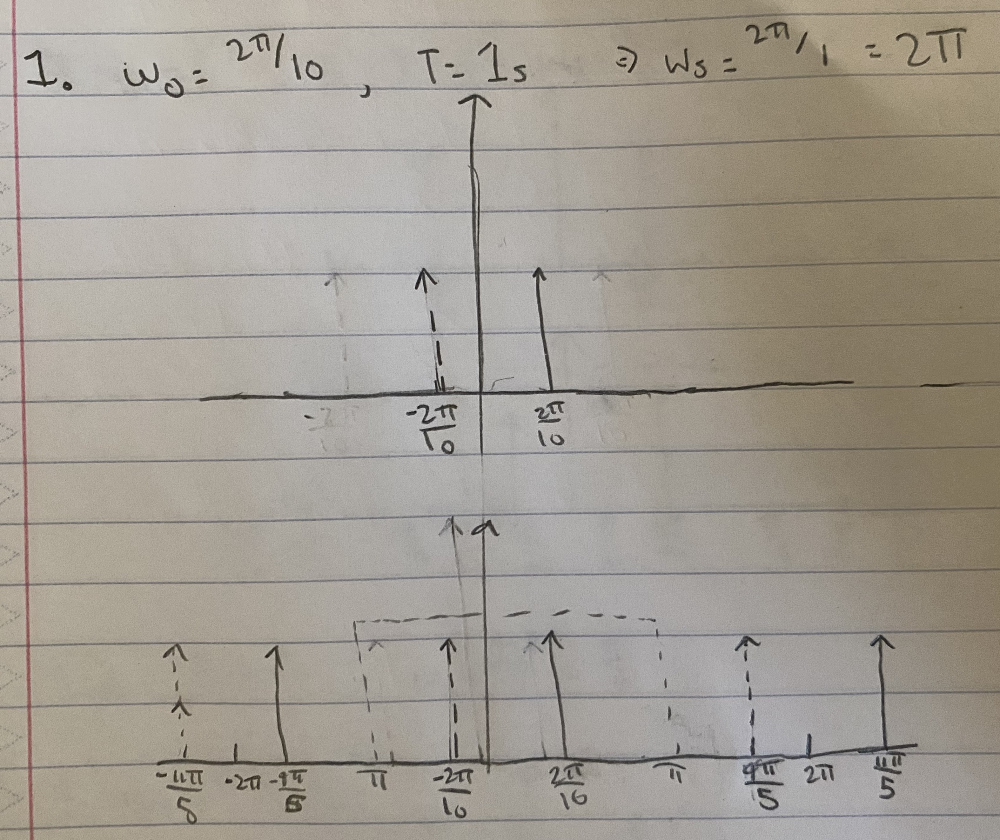

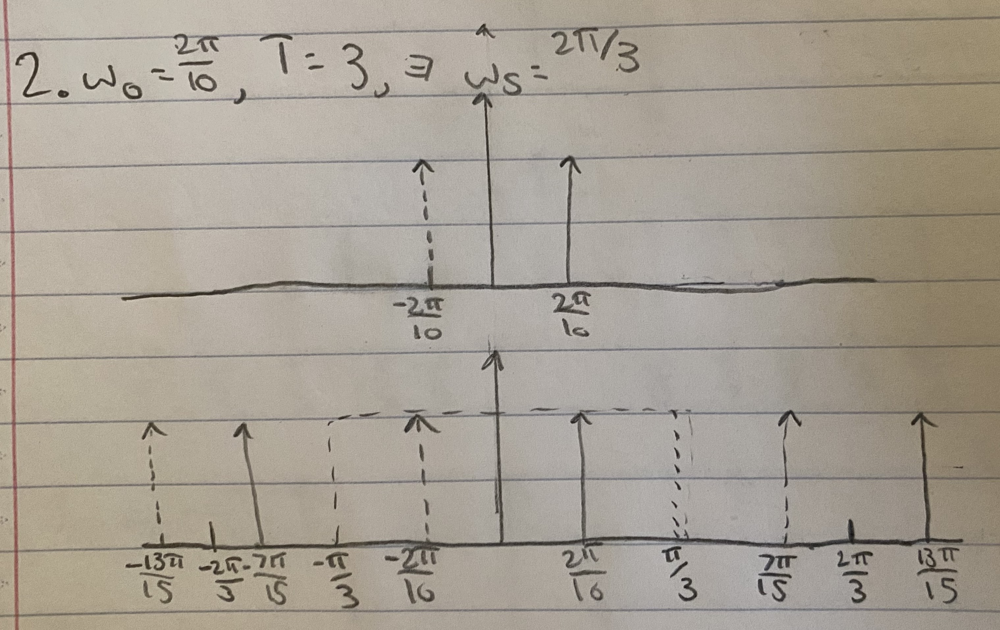

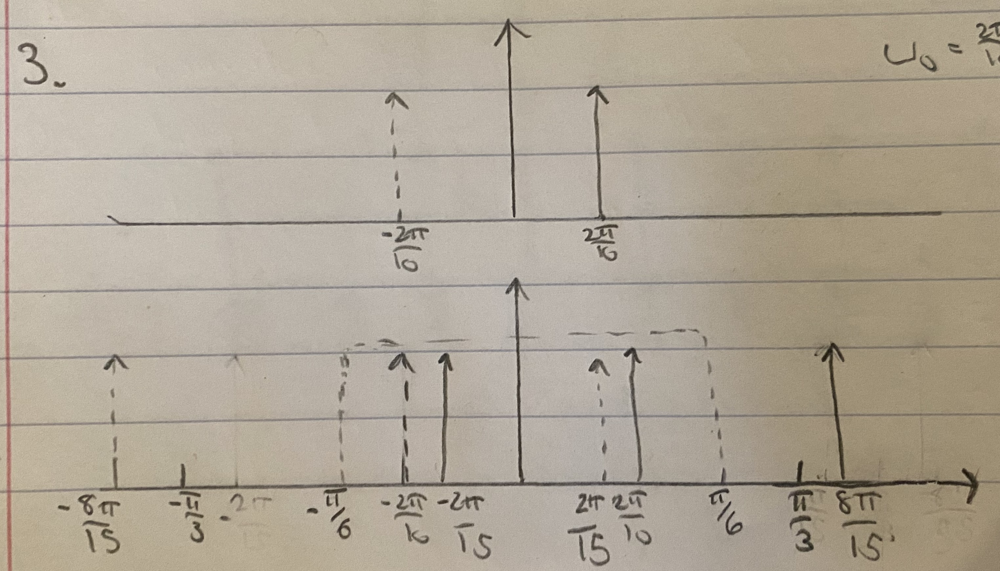

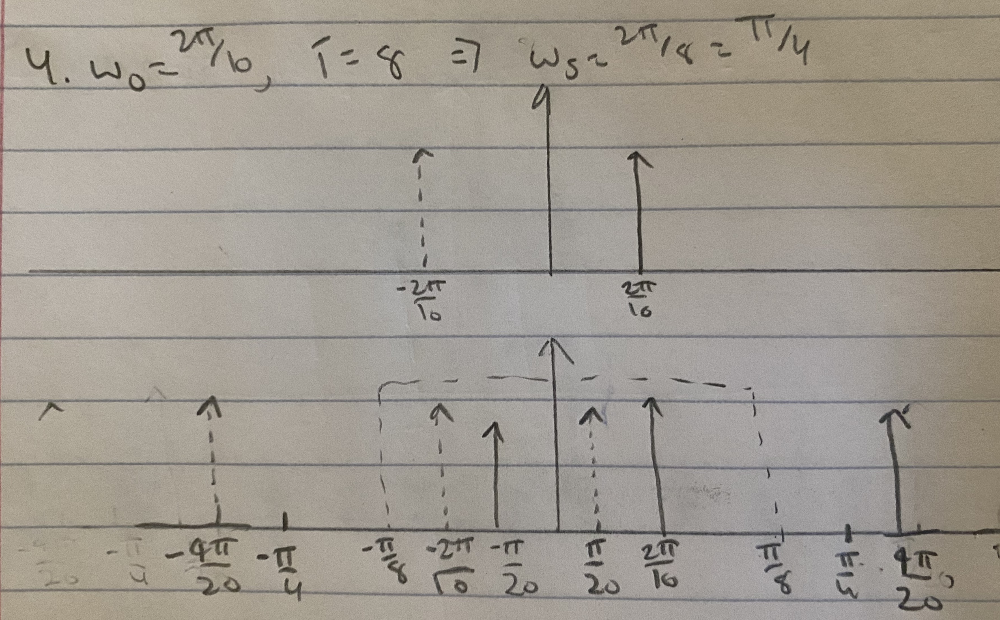

###### 5 Write one paragraph on your comments/observations of these results

We see that as our sampling interval, $T$, increases, the spectrum of our sampled signal decreases. Addiotionally, as $T$ increases, we see that our solid line in the negaitve plane and our dotted line in the positve plane, trend closer to our dotted box. From the information I can find I think this means that these sampled-frequencies within the dotted rectangle would be aliased. This would make sense because as our sampling interval increases, the chance of aliased frequencies would also increase.

#### Part 2 - Varying Input Frequency

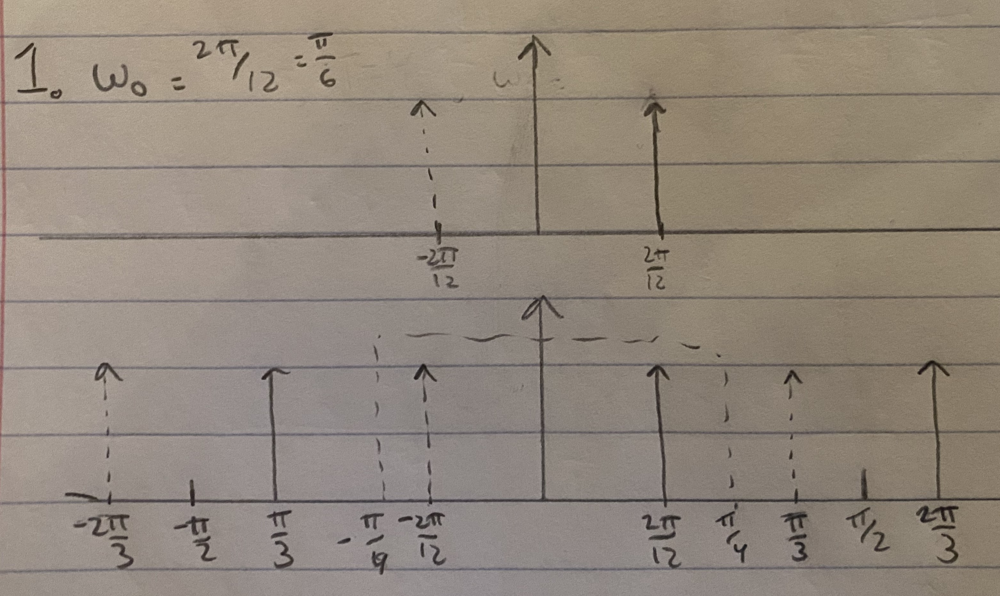

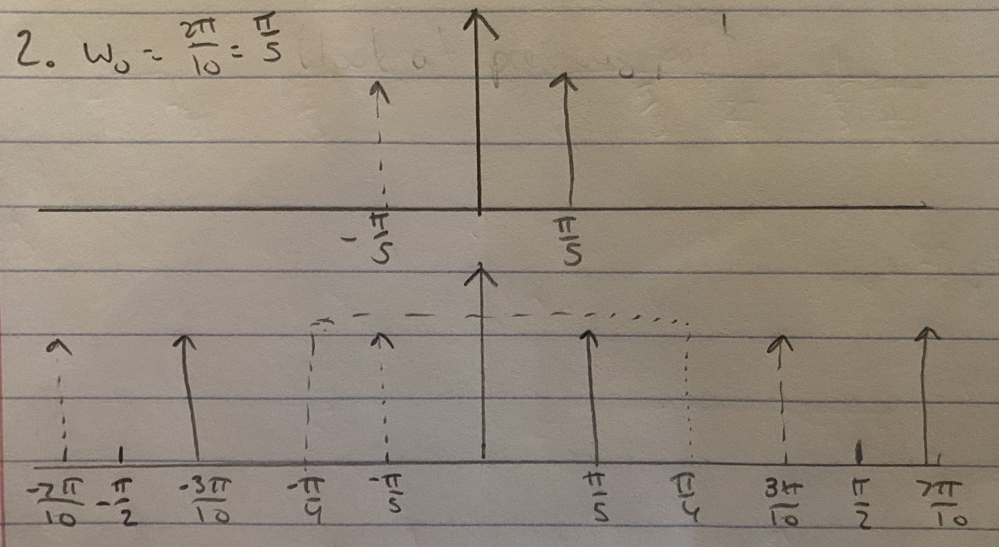

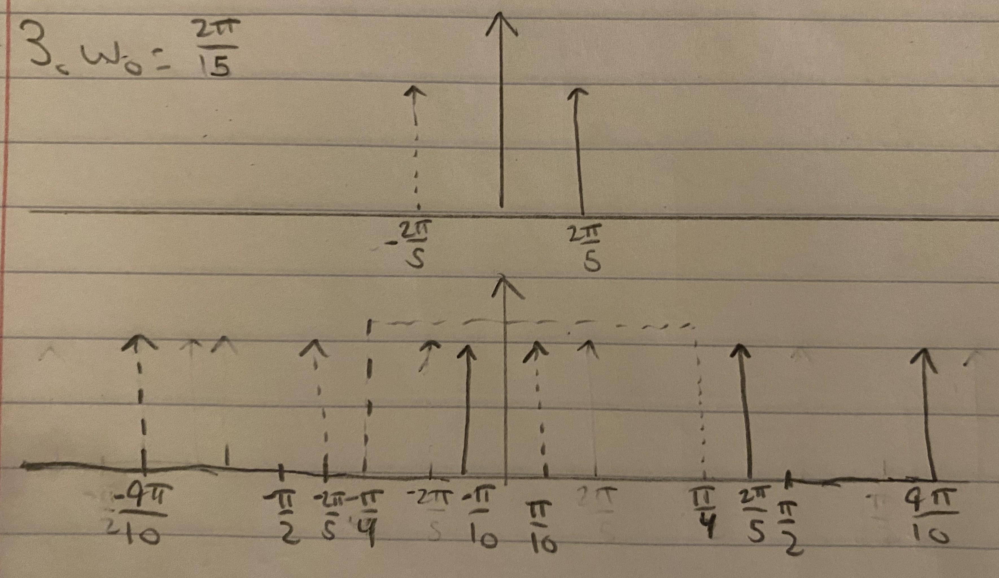

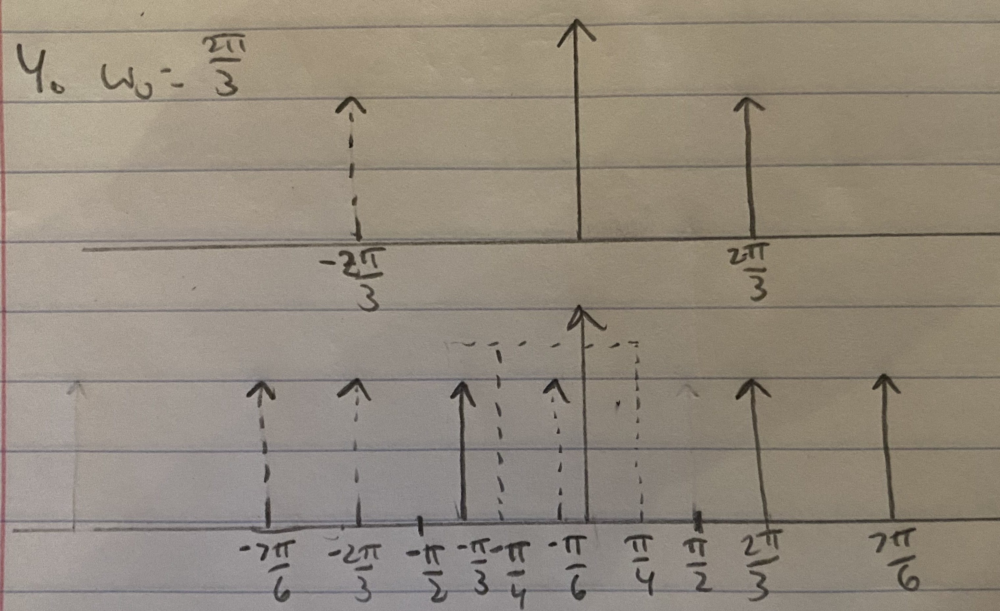

###### 5 Write one paragraph on your comments/observations of these results

We see some very interesting behavior. As our input frequency increases, the length or spread of our potential frequencies increase, menaing our farthest out lines are growing in magnitue. Additionaly, we see that as input frequency increases, all of our lines trend away from our dotted rectangle. Again, I am not really sure what the dotted rectangle represents, so I am not sure what this trend suggests. Overall, as our input signal's single frequency increases, the spectrum of our sampled signal with a fixed sampling interval, also increases.

## Topic 3: Hard Thresholding and Soft Thresholding and their Applications

##### 1
We see that there are three values in our noisy signal, $2.6$, $-1.05$, and $<0.1$, thus if we were to apply denoising using hard thresholding with $\delta = 0.11$, only the first two coefficents would be preserved, resulting in the following denoised coefficients. 

Text(0.5, 1.0, 'Hard Thresholding with $\\delta = 0.11$')

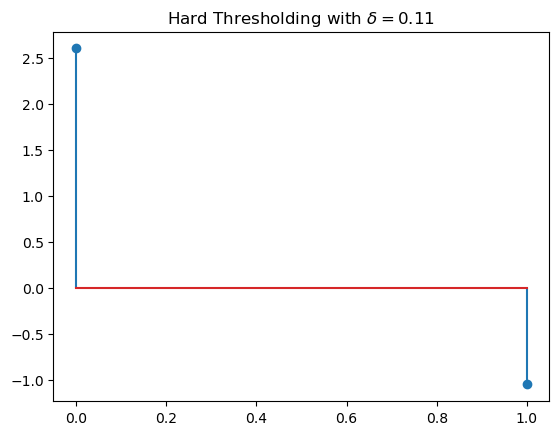

In [3]:
coef1=[2.6, -1.05]
plt.stem(coef1)
plt.title(r"Hard Thresholding with $\delta = 0.11$")

##### 2

We see that the additional noise would go to zero again. Our positive coefficient would go to $2.6 - \delta= 2.6-.11=2.49$. The negative coefficient would become $-1.05 + \delta = -1.05 + .11 = -0.94$.

Text(0.5, 1.0, 'Soft Thresholding with $\\delta = 0.11$')

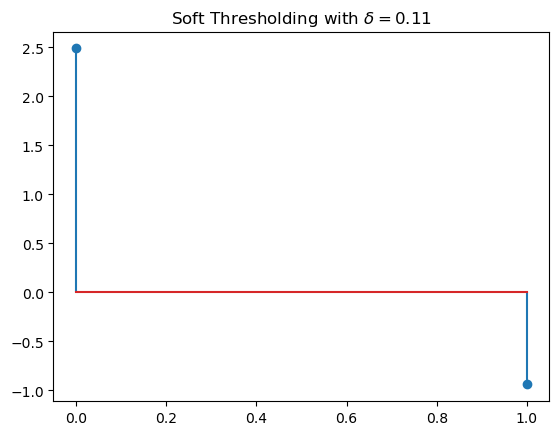

In [4]:
coef2=[2.49, -0.94]
plt.stem(coef2)
plt.title(r"Soft Thresholding with $\delta = 0.11$")

##### 3
Would this solution be the same as problem $1$. All of our coefficient values that are not noise are all greater than $.7$ in magnitude.

Text(0.5, 1.0, 'Hard Thresholding with $\\delta = 0.7$')

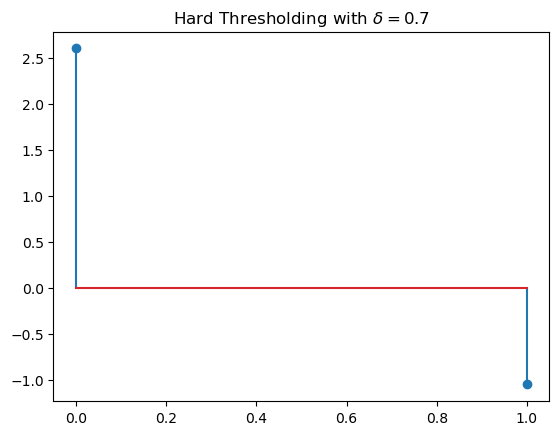

In [5]:
coef3=[2.6, -1.05]
plt.stem(coef3)
plt.title(r"Hard Thresholding with $\delta = 0.7$")

##### 4
We see that the additional noise would go to zero again. Our positive coefficient would go to $2.6 - \delta= 2.6-.7=1.9$. The negative coefficient would become $-1.05 + \delta = -1.05 + .7 = -0.35$.

Text(0.5, 1.0, 'Soft Thresholding with $\\delta = 0.7$')

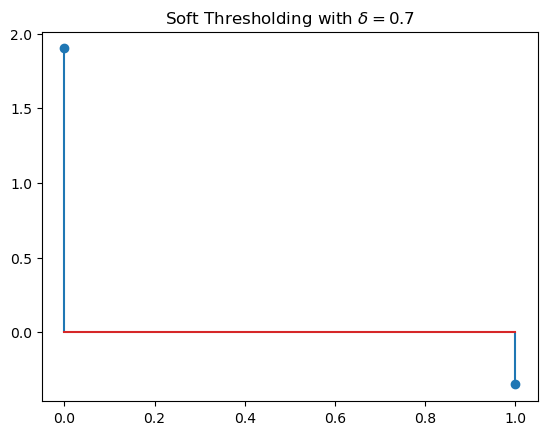

In [6]:
coef4=[1.9, -0.35]
plt.stem(coef4)
plt.title(r"Soft Thresholding with $\delta = 0.7$")

##### 5
We see that the different values of $\delta$ don't seem to impact our larger coefficients when using a hard thresholding. When using a soft thresholding the different deltas impact the coefficients more. We see that the larger $\delta = 0.7$ causes our coefficients to shrink more than the smaller delta.

I did not use the thresholding on the accurate signal, because it would not change for the hard thresholding, and for soft thresholding our coefficients would shrink/shorten the amount of our delta. 

##### 6

It seems like delta should represent the amount or magnitude of noise in our signal. In the plots provided, our noise would be around $0.1$, so if we were able to automatically eliminate this value from every coefficient, like we did with soft thresholding, then we would have a very close approximate to our accurate signal. 

There are a couple of different ways we could estimate delta. My initial thought was to look at the variance of our signal, but then I realized the variance would naturally be high if we have small noise but larger coefficients. We could figure out a way to normalize our variance and then use that as delta. Another way would be to determine larger components, then remove them and find the variance and use that as our delta.

## Topic 4: Understanding Basic Components of Nyquist Sampling

##### 1
Nyquist sampling gives us the boundarys and parameters to ensure we can sample a signal without aliasing. Aliasing is when we have different frequency components that overlapp each other. Additionally, when a sample signal is unaliased we can recover our original signal, thus Nyqusit sampling also ensures we can recover our original signal. Specifically, nyquist sampling says, that if our nyquist sampling rate is greater than two times our bandwidth, we will avoid aliasing.      

##### 2 ChatGPT's response:

Nyquist Sampling is a fundamental concept in signal processing and digital communication. It's named after the Swedish-American engineer Harry Nyquist. The Nyquist Sampling Theorem states that in order to accurately reconstruct a continuous signal from its samples, the sampling frequency must be at least twice the maximum frequency present in the signal.

In simpler terms, if you want to faithfully capture and reconstruct a signal without losing information, you need to sample it at a rate higher than twice its highest frequency component. This ensures that there are enough samples to capture the variations in the signal accurately.

Nyquist Sampling is crucial in various fields such as telecommunications, digital audio, image processing, and many others where analog signals are converted to digital form for processing, transmission, or storage.


##### 3

(1) The common part is the overall goal and purpose of Nyquist Sampling. To ensure that we can reconstruct a continuos signal from its samples. 


(2) ChatGPT did not directly mention aliasing as the reason we want to follow Nyquist Sampling. 


(3) ChatGPT seems to know about what is happening 'behind the scenes' of aliasing. Like when it mentions ensuring there is enough samples to capture variations in the signal.

##### 4
I think the differences are very telling about where I learned my information and who ChatGPT feels its audience is. I learned about nyquist sampling in a college course, so I learned more official terminoloy and it was explained in a way where it was assumed I had a background in signals. Whereas ChatGPT explains it in a way where someone who has never taken a course in signals, or maybe just an introductory physics course, could still understand it.  